# tmp — apr24

**Motivation**: scratch notebook <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'poisson'

In [3]:
name = '/'.join([
    'poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>',
    'initscale-0.05_warmrestart-2_mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,17:07)',
])
tr, meta = load_quick(name, device=device, lite=False)
data, loss, etc = tr.validate()

print(meta)

{
    'timestamp': '2024_05_01,17:07',
    'checkpoint': 1050,
    'global_step': 315000,
    'file': 'PoissonVAE+TrainerVAE-1050_(2024_05_01,20:07).pt',
    'path': 
'/home/hadi/Projects/PoissonVAE/models/poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>/initscale-0.05
_warmrestart-2_mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,17:07)'
}

In [4]:
epochs = range(meta['checkpoint'], tr.cfg.epochs)
tr.train(epochs=epochs, fresh_fit=False)

epoch # 1200, avg loss: 32.957339: 100%|██████████████████████████| 150/150 [26:54<00:00, 10.76s/it]


In [6]:
os.path.basename(tr.model.chkpt_dir)

'initscale-0.05_warmrestart-2_mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,17:07)'

In [4]:
self = tr

In [5]:

comment = self.cfg.name()

In [6]:
self.optim_schedule.T_max

71700.0

In [7]:
tr.model.timestamp

'2024_05_01,17:07'

In [9]:
print(sorted(os.listdir(tr.model.chkpt_dir)))

[
    'ConfigTrainVAE.json',
    'PoissonVAE+TrainerVAE-0050_(2024_05_01,17:16).pt',
    'PoissonVAE+TrainerVAE-0100_(2024_05_01,17:25).pt',
    'PoissonVAE+TrainerVAE-0150_(2024_05_01,17:34).pt',
    'PoissonVAE+TrainerVAE-0200_(2024_05_01,17:42).pt',
    'PoissonVAE+TrainerVAE-0250_(2024_05_01,17:51).pt',
    'PoissonVAE+TrainerVAE-0300_(2024_05_01,18:00).pt',
    'PoissonVAE+TrainerVAE-0350_(2024_05_01,18:09).pt',
    'PoissonVAE+TrainerVAE-0400_(2024_05_01,18:17).pt',
    'PoissonVAE+TrainerVAE-0450_(2024_05_01,18:26).pt',
    'PoissonVAE+TrainerVAE-0500_(2024_05_01,18:35).pt',
    'PoissonVAE+TrainerVAE-0550_(2024_05_01,18:43).pt',
    'PoissonVAE+TrainerVAE-0600_(2024_05_01,18:52).pt',
    'PoissonVAE+TrainerVAE-0650_(2024_05_01,19:01).pt',
    'PoissonVAE+TrainerVAE-0700_(2024_05_01,19:09).pt',
    'PoissonVAE+TrainerVAE-0750_(2024_05_01,19:18).pt',
    'PoissonVAE+TrainerVAE-0800_(2024_05_01,19:27).pt',
    'PoissonVAE+TrainerVAE-0850_(2024_05_01,19:35).pt',
    'PoissonVAE+TrainerVAE-0900_(2024_05_01,19:43).pt',
    'PoissonVAE+TrainerVAE-0950_(2024_05_01,19:51).pt',
    'PoissonVAE+TrainerVAE-1000_(2024_05_01,19:59).pt',
    'PoissonVAE+TrainerVAE-1050_(2024_05_01,20:07).pt',
    'TrainerVAE.log'
]

In [10]:
list(tr.stats)

['grad',
 'loss',
 'eval/mse',
 'eval/kl',
 'eval/kl_diag',
 'sprs/%-zero',
 'sprs/lifetime',
 'sprs/population',
 'knn/size=200',
 'knn/size=1000',
 'knn/size=5000']

In [11]:
tr.model.chkpt_dir

'/home/hadi/Projects/PoissonVAE/models/poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>/initscale-0.05_warmrestart-2_mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,17:07)'

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST')
cfg_tr['warm_restart'] = 1
cfg_tr['epochs'] = 1200
cfg_tr['lr'] = 5e-3

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'prior_clamp': -3.0, 'prior_log_dist': 'uniform', 'init_scale': 0.05, 'rmax_q': 1.0, 
'n_latents': 10, 'enc_type': 'conv', 'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'weight_norm': False}

Trainer:
{'method': 'mc', 'kl_beta': 1.0, 'kl_anneal_portion': 0.5, 'lambda_anneal': True, 'lambda_init': 0.0, 
'lambda_norm': 0.0, 'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 0.05, 
'lr': 0.005, 'epochs': 1200, 'batch_size': 200, 'optimizer_kws': {'weight_decay': 0.0005}, 'grad_clip': 1000, 
'warm_restart': 1}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   2.6 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>
mc_b200-ep1200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_01,15:59)

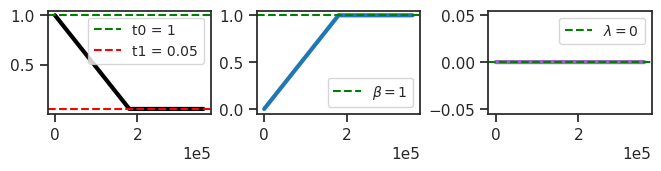

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')

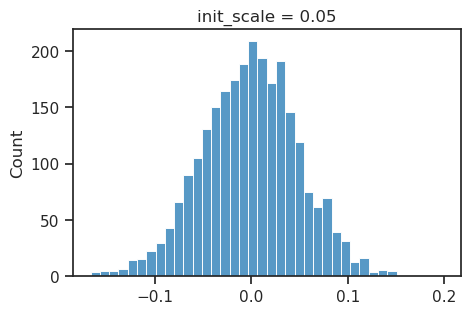

In [5]:
ax = sns.histplot(to_np(vae.fc_enc.weight.data).ravel())
ax.set_title(f"init_scale = {vae.cfg.init_scale}")
vae.fc_enc.bias.data

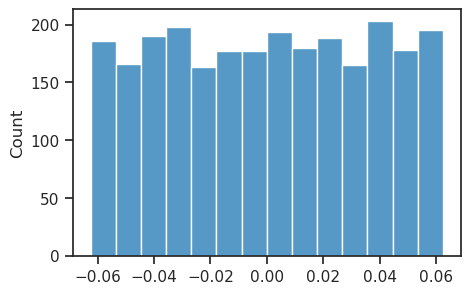

In [5]:
## w/o my normal init

In [6]:
print(vae)

PoissonVAE(
  (mse): MSELoss()
  (stem): Conv2D(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
  (enc): Sequential(
    (0): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (1): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(32, 64, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (3): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(64, 128, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (4): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (5): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(128, 256, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=256, out_features=16, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=16, out_features=256, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (6): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    

In [7]:
comment = f"initscale-0.05_warmrestart-1_{tr.cfg.name()}"
# comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 1200, avg loss: 33.007702: 100%|██████████████████████| 1200/1200 [3:28:17<00:00, 10.41s/it]


In [8]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 27.3229, 'kl': 8.879111, 'kl_diag': 0.88791114, 'tot': 36.20201}

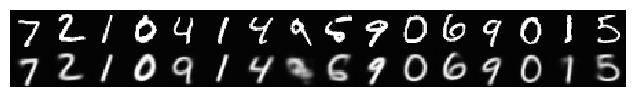

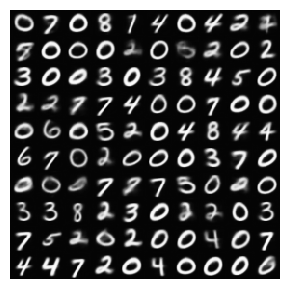

In [9]:
tr.show_recon(0.0), tr.show_samples(0.0);

In [14]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['r*dr'][:, i],
        f'z-{j}': etc['r*dr'][:, j],
        f'z-{i}_log': np.log(etc['r*dr'][:, i]),
        f'z-{j}_log': np.log(etc['r*dr'][:, j]),
        'lbl': to_np(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

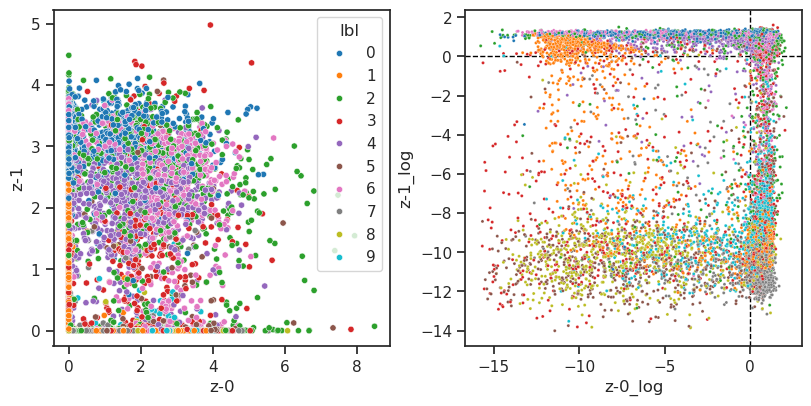

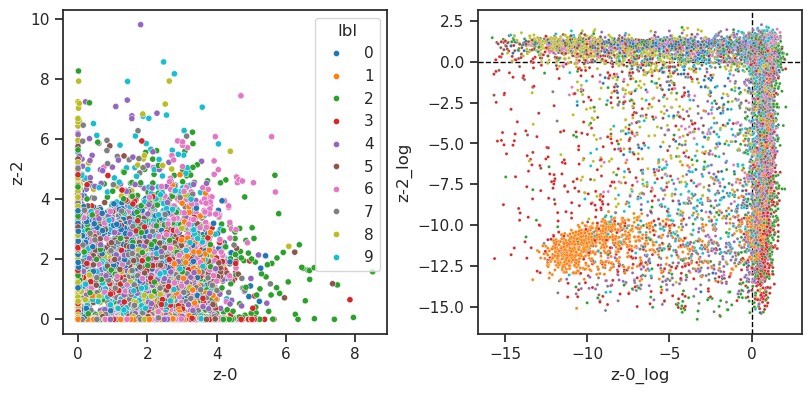

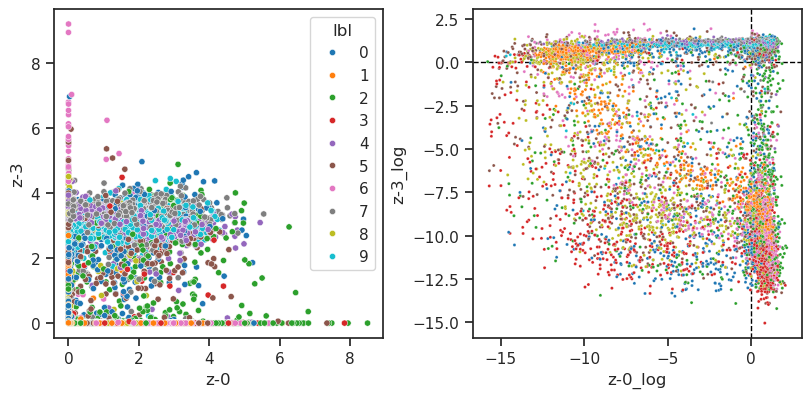

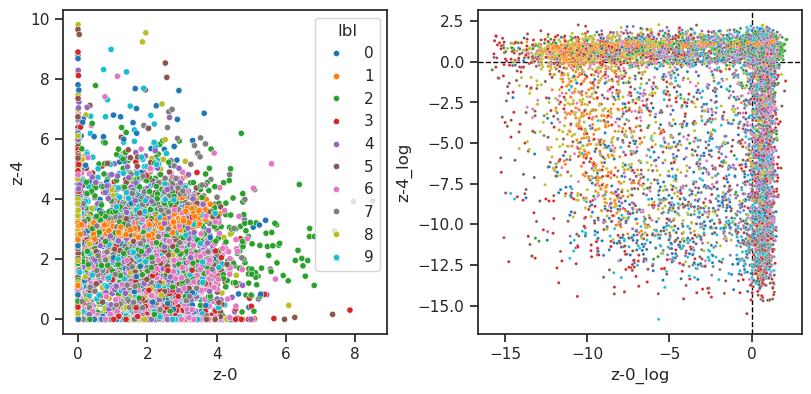

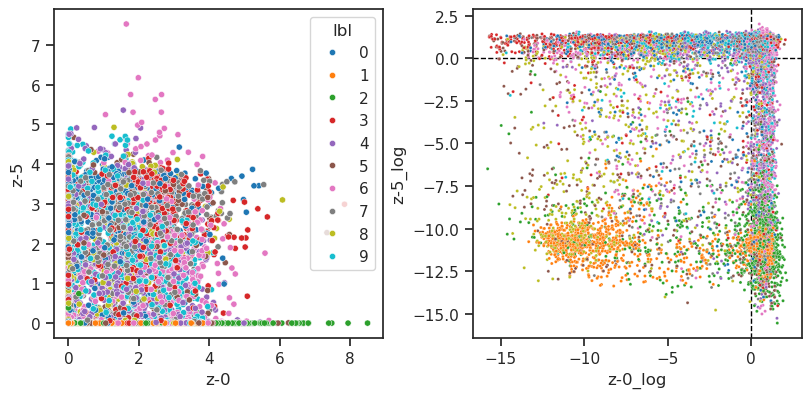

...

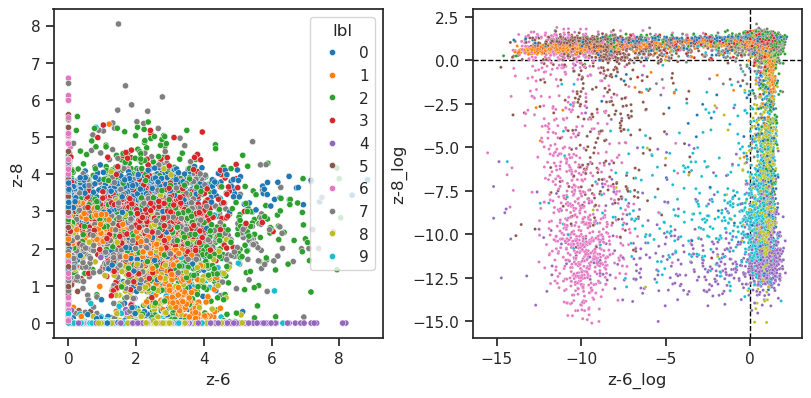

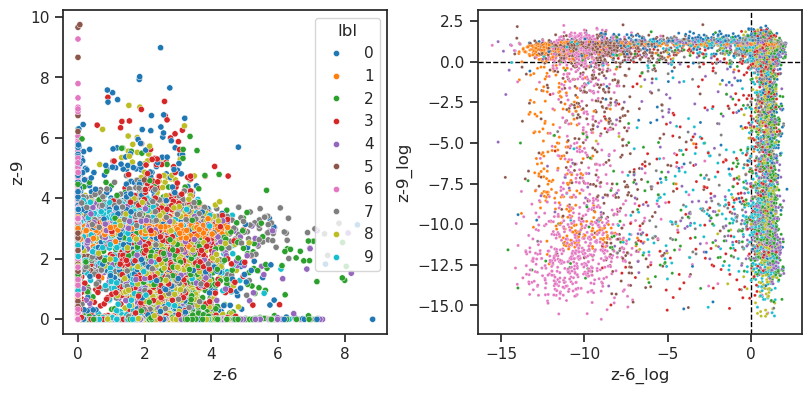

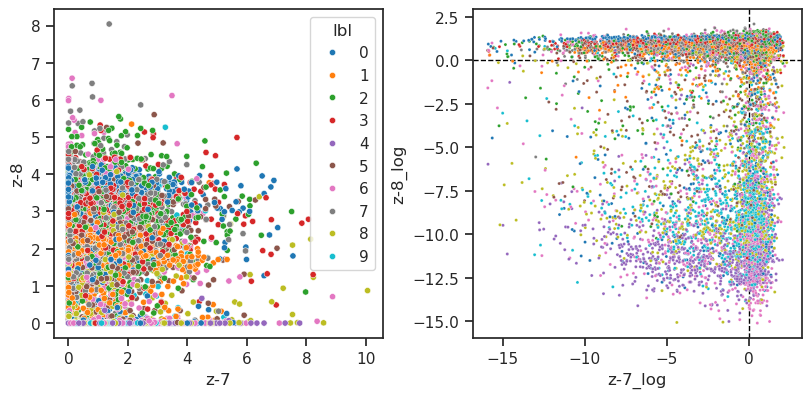

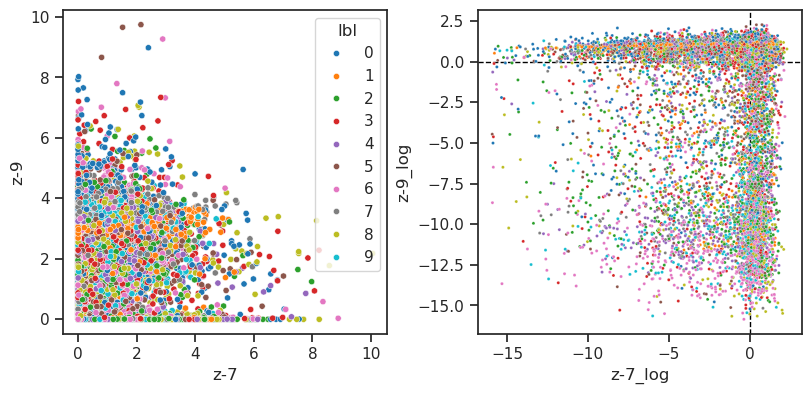

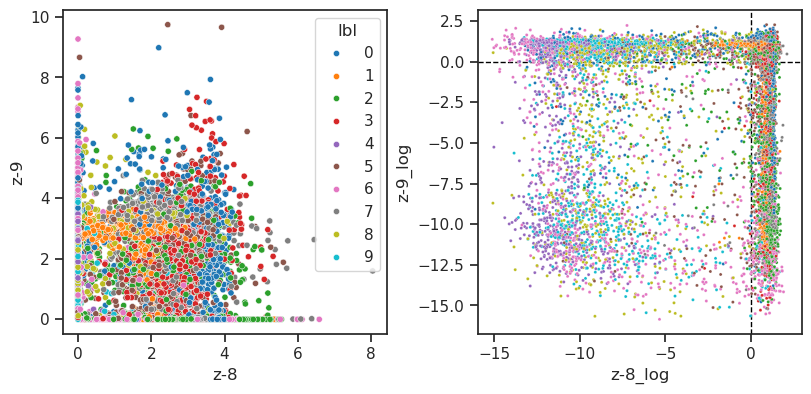

In [15]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

In [16]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=to_np(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [01:47<00:00,  7.46it/s]


In [17]:
df_summary

,mean,std
size,,
20,0.349374,0.045278
50,0.573944,0.044474
100,0.717862,0.040679
200,0.831302,0.028114
500,0.903882,0.013580
1000,0.930574,0.006954
2000,0.942512,0.005159
4000,0.952166,0.001908
5000,0.955000,NaN


In [18]:
vae.cfg.init_scale

0.05

In [3]:
x = np.load('/home/dekel/Documents/_PoissonVAE/hadi_activations.npz')['activations']

In [4]:
lifetime, population, percent = sparse_score(x.astype(float))
print(percent)

{'0': 92.4, '1': 6.1, '2': 1.1, '3': 0.3, '4+': 0.1}

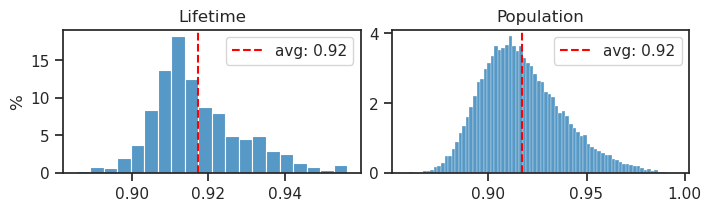

In [5]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [11]:
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)
# or any of these variants
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet34', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet101', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet152', pretrained=True)
model.eval()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /home/hadi/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/hadi/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44.7M/44.7M [00:00<00:00, 115MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [16]:
x = torch.randn(123, 3, 256, 256)

In [17]:
model(x).shape

torch.Size([123, 1000])

In [25]:
y1 = model.conv1(x)
y2 = model.maxpool(y1)
y3 = model.layer1(y2)
y4 = model.layer2(y3)
y5 = model.layer3(y4)
y6 = model.layer4(y5)
y7 = model.avgpool(y6)

y1.shape, y2.shape, y3.shape, y4.shape, y5.shape, y6.shape, y7.shape

(torch.Size([123, 64, 128, 128]),
 torch.Size([123, 64, 64, 64]),
 torch.Size([123, 64, 64, 64]),
 torch.Size([123, 128, 32, 32]),
 torch.Size([123, 256, 16, 16]),
 torch.Size([123, 512, 8, 8]),
 torch.Size([123, 512, 1, 1]))

In [2]:
def _show_pairwise(i, j, data: np.ndarray, func: Callable):
    fname = f"{func.__name__}(z)"
    df = pd.DataFrame({
        f'z_{i}': data[:, i],
        f'z_{j}': data[:, j],
        f'{fname}_{i}': func(data[:, i]),
        f'{fname}_{j}': func(data[:, j]),
        'lbl': tr.dl_vld.dataset.tensors[1],
    })
    fig, axes = create_figure(1, 2, (10, 5.5), layout='constrained')
    sns.scatterplot(data=df, x=f'{fname}_{i}', y=f'{fname}_{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z_{i}', y=f'z_{j}', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

In [4]:
kws_vae = dict(
    dataset='MNIST',
    n_latents=10,
    enc_type='conv',
    dec_type='conv',
    enc_bias=True,
    dec_bias=True,
    weight_norm=False,
    rmax_q=1.0,
)
kws_tr = dict(
    kl_beta=1.0,
    
    batch_size=200, epochs=900, lr=1e-3,

    temp_stop=0.1,
    temp_anneal_type='lin',
    temp_anneal_portion=0.5,
    kl_anneal_portion=0.3,
    
    lambda_norm=0.001,
    
    optimizer_kws={'weight_decay': 3e-4},
)

vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**kws_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**kws_tr), device=device)

In [5]:
# comment = f"kl-const-0.0001_{tr.cfg.name()}"
comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 900, avg loss: 31.481094: 100%|█████████████████████████| 900/900 [3:03:47<00:00, 12.25s/it]


-- paste here:

In [5]:
name = '/'.join([
    # 'poisson_uniform_c(-3)_rmax(1)_MNIST_z-20_k-32_<conv+b|conv+b>_wn',
    # 'mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_24,18:54)',

    # 'gaussian_None_MNIST_z-10_k-32_<conv+b|conv+b>_wn',
    # 'mc_b200-ep600-lr(0.001)_beta(1:0x0.5)_gr(500)_(2024_04_26,07:57)',

    
    'poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>',
    'mc_b200-ep900-lr(0.003)_beta(1:0x0.3)_temp(0.05:lin-0.5)_gr(500)_(2024_04_28,19:54)',
    # 'mc_b200-ep600-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_lamb(0.01)_gr(500)_(2024_04_26,21:49)',
    
    # 'mc_b60-ep200-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,20:27)',
    # 'warm1_mc_b60-ep600-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,22:44)',

    # 'mc_b200-ep600-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,20:15)',
    # 'warm1_mc_b200-ep1800-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,22:45)',


    # 'poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>_wn',
    # 'mc_b100-ep400-lr(0.0005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,11:53)',
    # 'mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_23,14:55)'  # (best: 0.97)
    # 'mc_ep400-b100-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,09:00)',
    # 'mc_ep1200-b300-lr(0.001)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_25,00:50)',
])

In [4]:
tr, meta = load_quick(name, device=device, lite=False)
data, loss, etc = tr.validate()

print(meta)

{
    'timestamp': '2024_04_28,19:54',
    'checkpoint': 900,
    'global_step': 270000,
    'file': 'PoissonVAE+TrainerVAE-0900_(2024_04_28,22:47).pt',
    'path': 
'/home/hadi/Projects/PoissonVAE/models/poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>/mc_b200-ep900-
lr(0.003)_beta(1:0x0.3)_temp(0.05:lin-0.5)_gr(500)_(2024_04_28,19:54)'
}

## KNN across checkpoints

In [6]:
df, df_summary = [], []
for chkpt in tqdm(np.linspace(50, 900, 18), ncols=80):
    tr, meta = load_quick(name, device=device, lite=False, checkpoint=int(chkpt))
    data, loss, etc = tr.validate()
    
    _df, _df_summary = knn_analysis(
        x=etc['log_dr'],
        y=to_np(tr.dl_vld.dataset.tensors[1]),
        n_iter=100,
        verbose=False,
    )
    _df.insert(0, 'type', 'poisson')
    _df.insert(0, 'checkpoint', int(chkpt))
    _df_summary.insert(0, 'type', 'poisson')
    _df_summary.insert(0, 'checkpoint', int(chkpt))
    
    df.append(_df)
    df_summary.append(_df_summary)

df = pd.concat(df)
df_summary = pd.concat(df_summary)

100%|██████████████████████████████████████████| 18/18 [32:50<00:00, 109.45s/it]


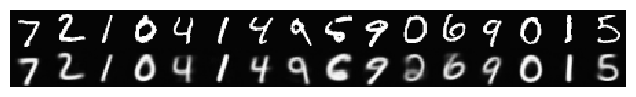

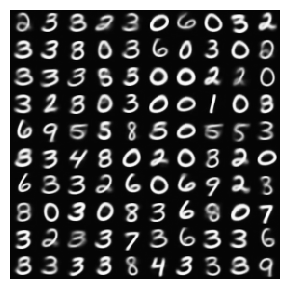

In [7]:
tr.show_recon(0.0), tr.show_samples(0.0);

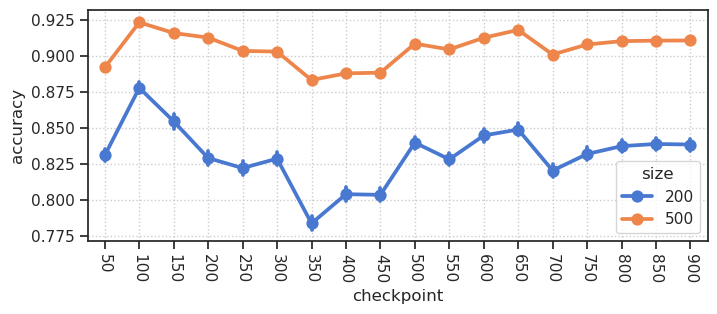

In [39]:
df2p = df.loc[df['size'].isin([200, 500])]

fig, ax = create_figure(1, 1, (8, 3))
sns.pointplot(data=df2p, x='checkpoint', y='accuracy', hue='size', palette='muted')
ax.tick_params(axis='x', rotation=-90)
ax.grid()

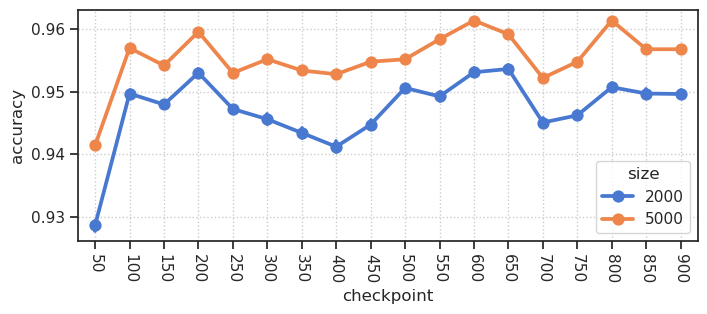

In [43]:
df2p = df.loc[df['size'].isin([2000, 5000])]

fig, ax = create_figure(1, 1, (8, 3))
sns.pointplot(data=df2p, x='checkpoint', y='accuracy', hue='size', palette='muted')
ax.tick_params(axis='x', rotation=-90)
ax.grid()

In [26]:
chkpt = 100

tr, meta = load_quick(name, device=device, lite=False, checkpoint=chkpt)
data, loss, etc = tr.validate()

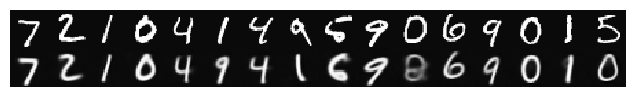

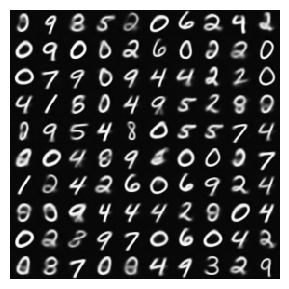

In [27]:
tr.show_recon(0.0), tr.show_samples(0.0);

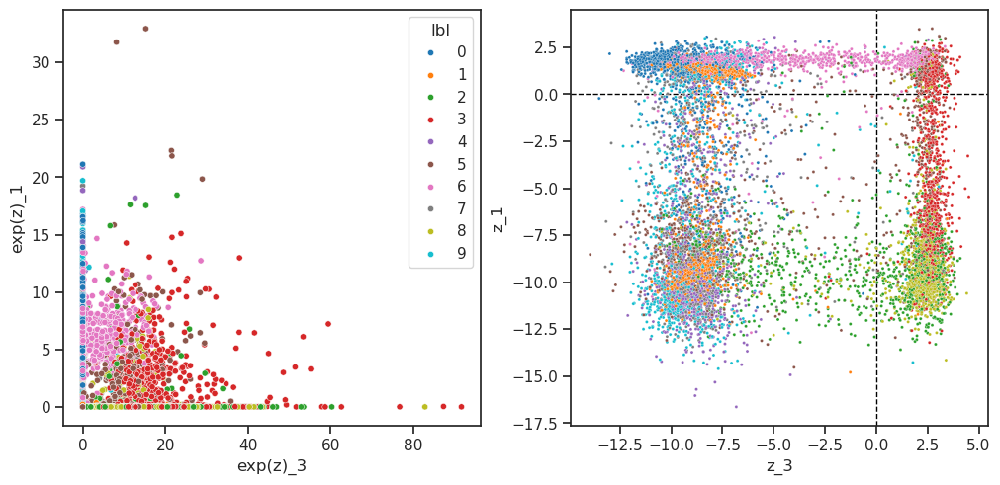

In [38]:
_show_pairwise(3, 1, etc['log_dr'], np.exp)

In [47]:
from analysis.mei import MEI

In [48]:
def func_kl(model, x, which_k, alpha=0.0):
    log_dr = model.encode(x)
    kl = model.loss_kl(log_dr).sum()
    y = log_dr.squeeze()[which_k]
    return y - kl.mul(alpha)


def func_silence(model, x, which_k, alpha=0.0):
    log_dr = model.encode(x).squeeze()
    y = log_dr[which_k]
    
    mask = torch.ones(model.cfg.n_latents, dtype=torch.bool)
    mask[which_k] = False
    reg = log_dr[mask].exp().sum()
    
    return y - reg.mul(alpha)

In [49]:
def _do_it(which_k: int, alpha: float, func):
    mei = MEI(
        model=tr.model,
        func=func,
        maximize=True,
        n_iter=int(5e3),
        kws_optim={
            'lr': 0.1,
            'weight_decay': 0.1},
    ).to(device)

    # fit
    mei.fit(which_k, alpha, verbose=False)
    x2p = to_np(mei._x().squeeze())

    # plot
    fig, axes = create_figure(1, 3, (9, 2.1), width_ratios=[0.7, 1, 1], layout='constrained')
    
    im = axes[0].imshow(x2p, cmap='Greys_r')
    plt.colorbar(im, ax=axes[0])
    
    axes[1].plot(mei.stats['y'], label='log_dr')
    _y = mei.stats['y'][-1]
    axes[1].axhline(_y, color='r', ls='--', label=f"y = {_y:0.4f}")
    axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
    
    axes[0].set_title(f"norm  = {mei.x.norm().item():0.3f}")
    add_legend(axes[1:])
    plt.show()

    return x2p, _y

  0%|                                                     | 0/5 [00:00<?, ?it/s]

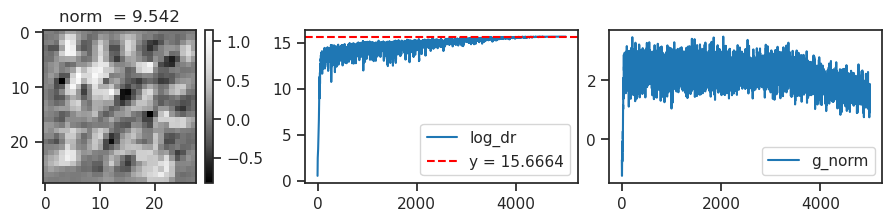

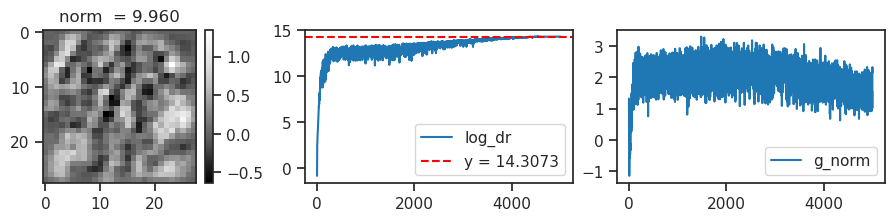

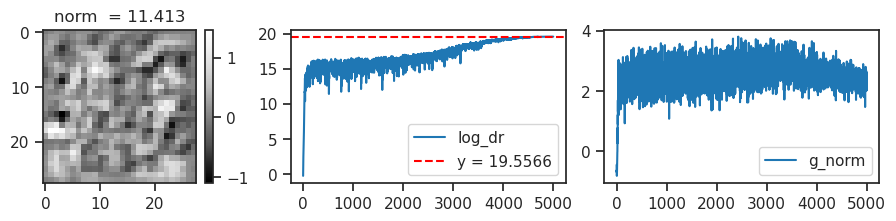

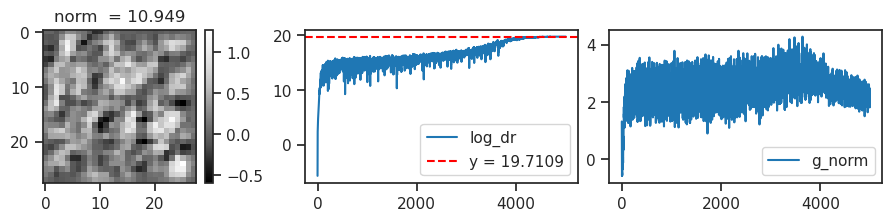

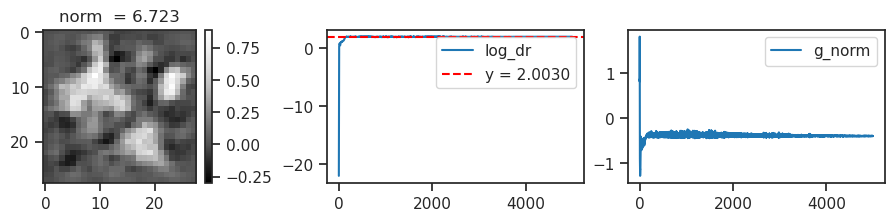

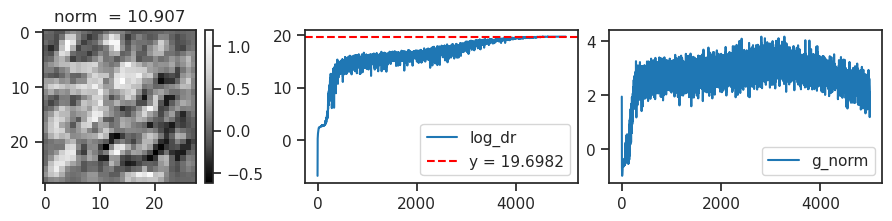

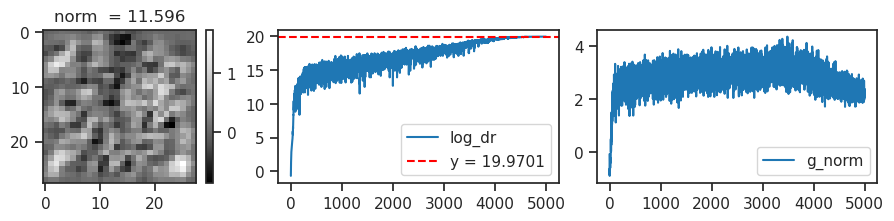

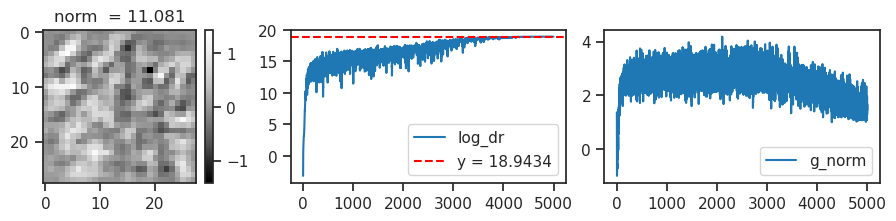

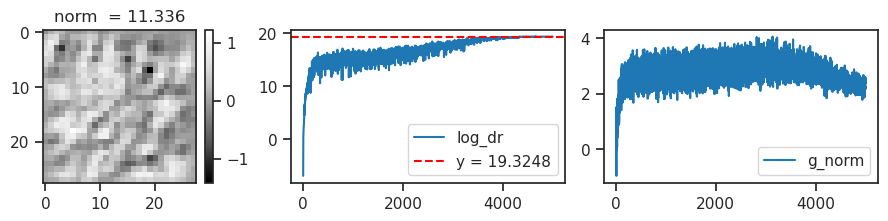

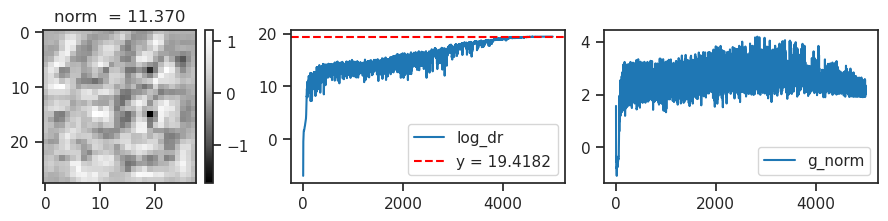

 20%|████████▊                                   | 1/5 [09:36<38:25, 576.28s/it]

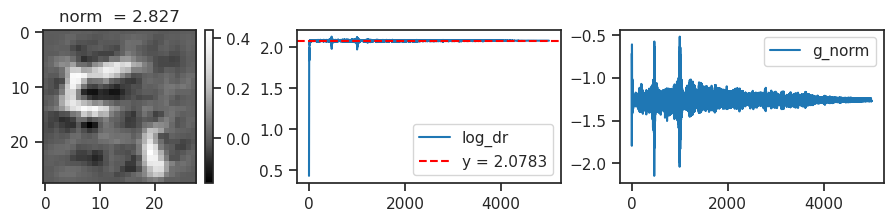

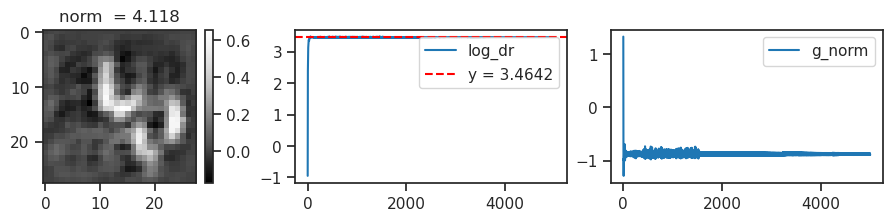

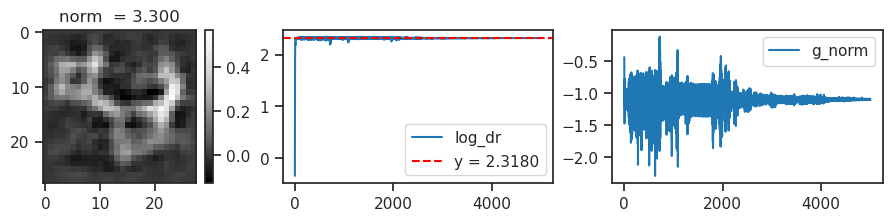

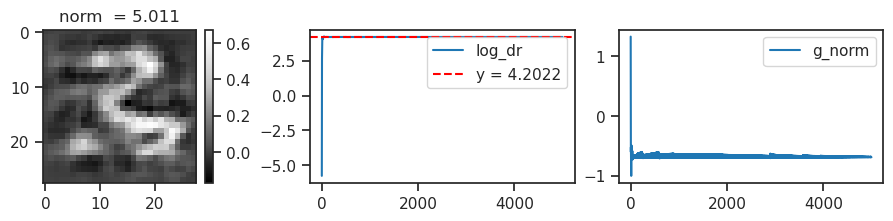

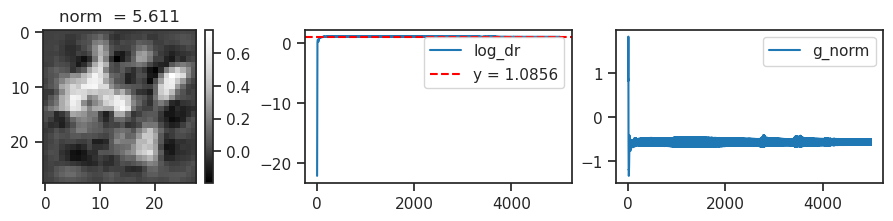

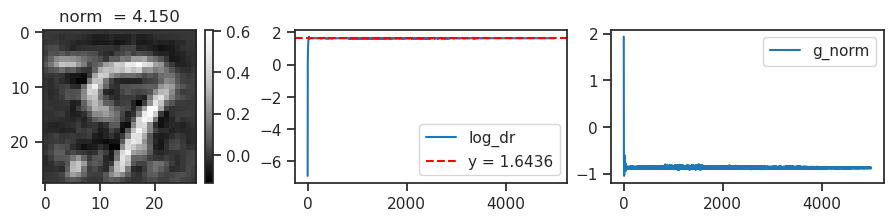

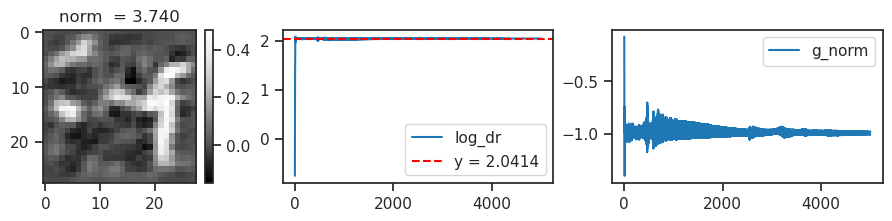

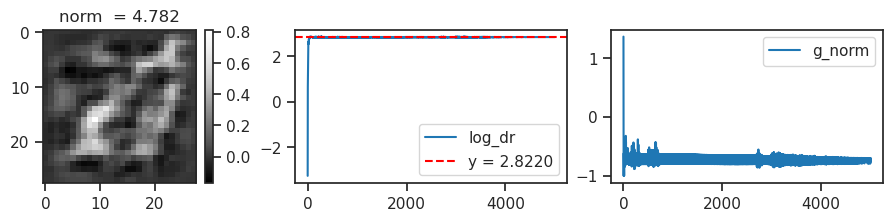

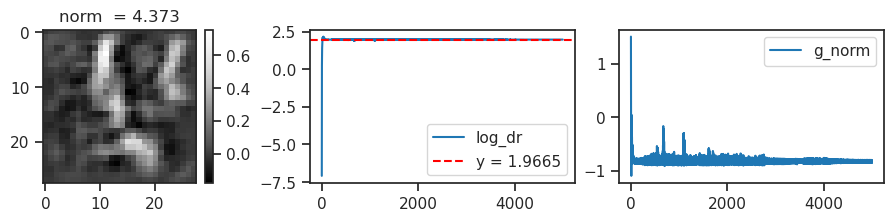

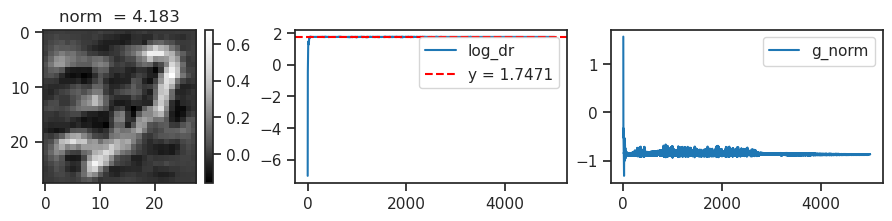

 40%|█████████████████▌                          | 2/5 [18:54<28:17, 565.72s/it]

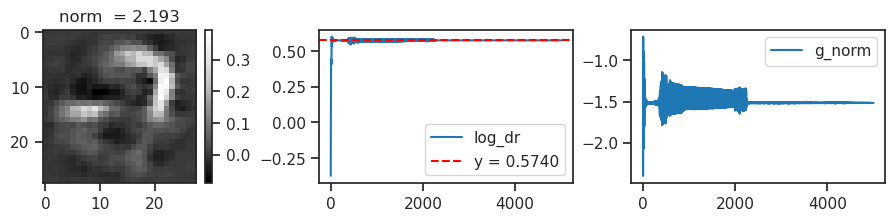

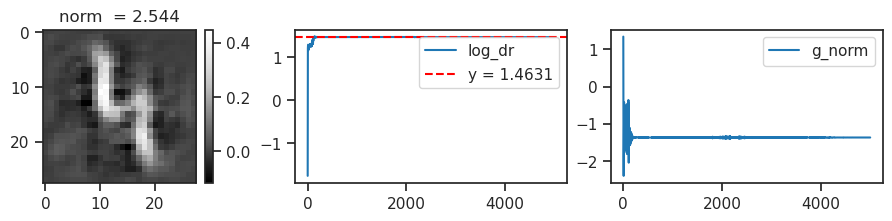

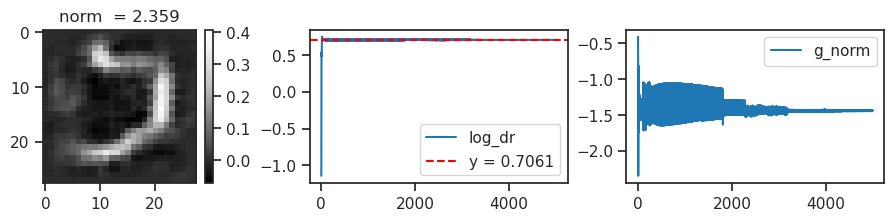

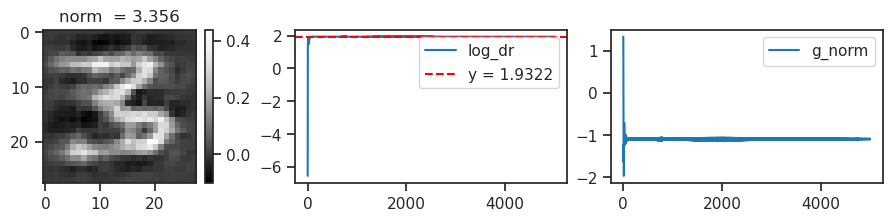

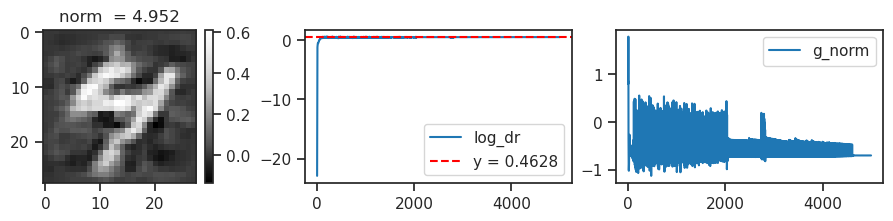

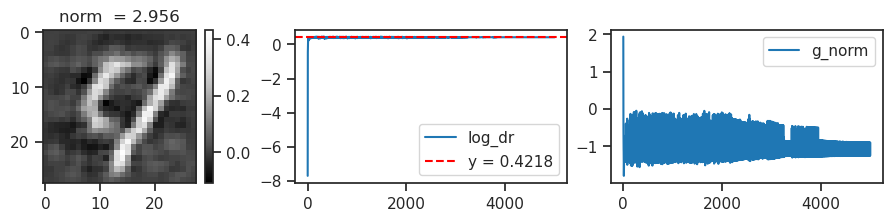

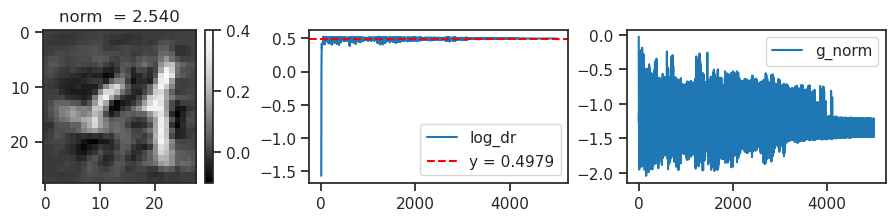

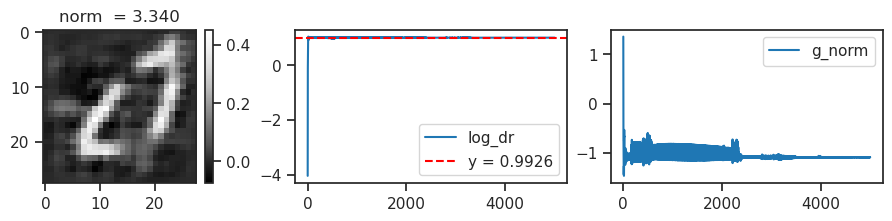

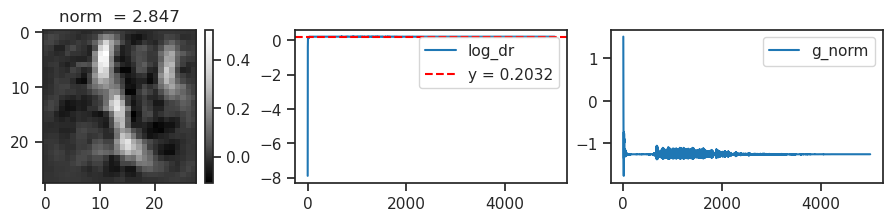

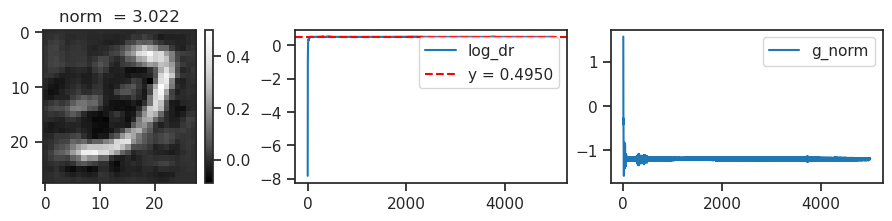

 60%|██████████████████████████▍                 | 3/5 [28:19<18:50, 565.40s/it]

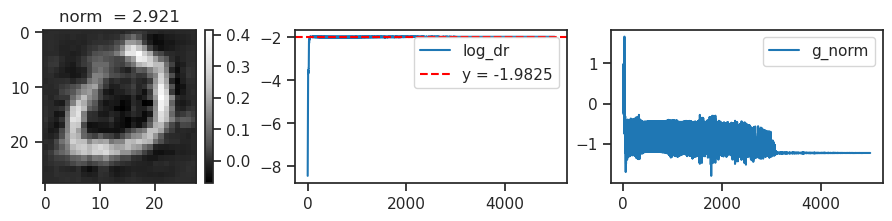

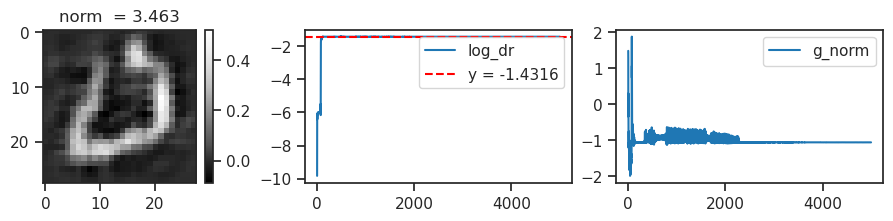

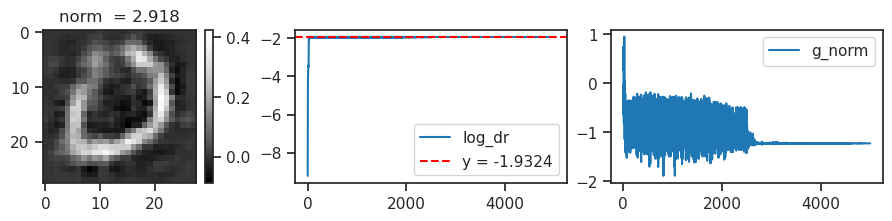

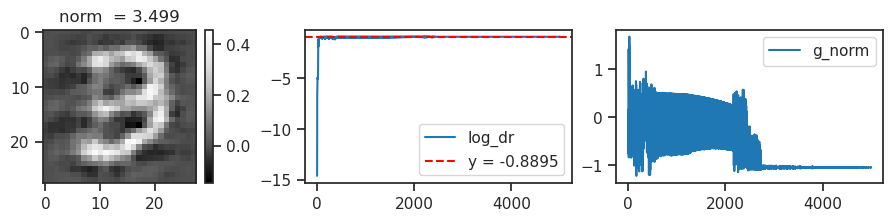

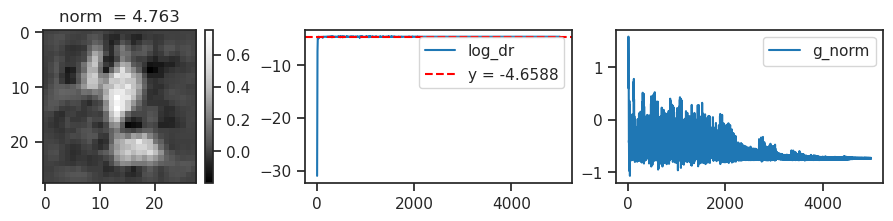

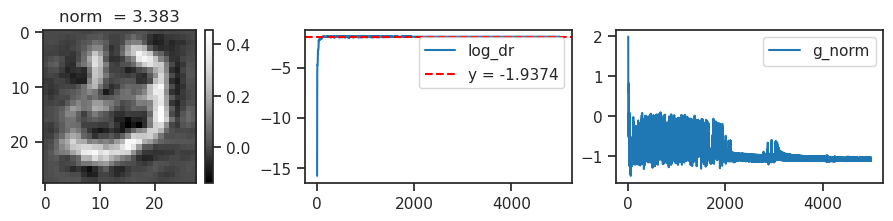

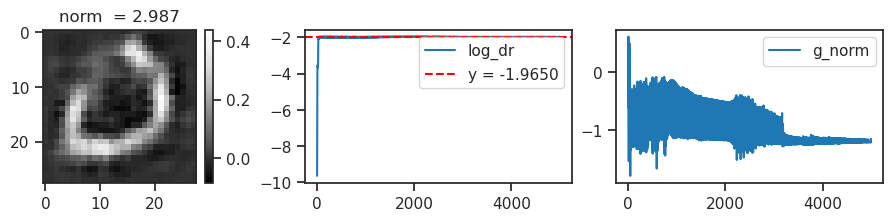

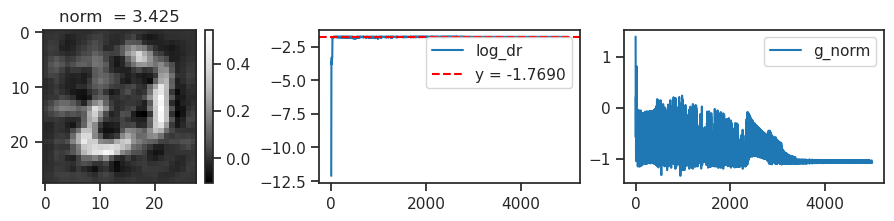

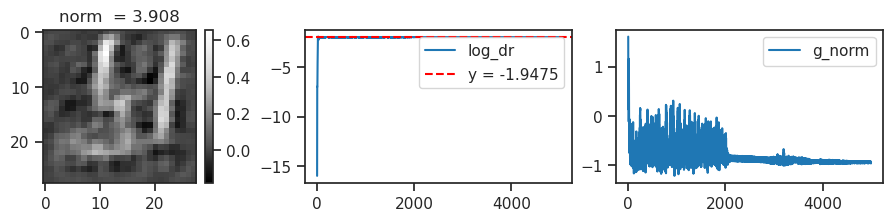

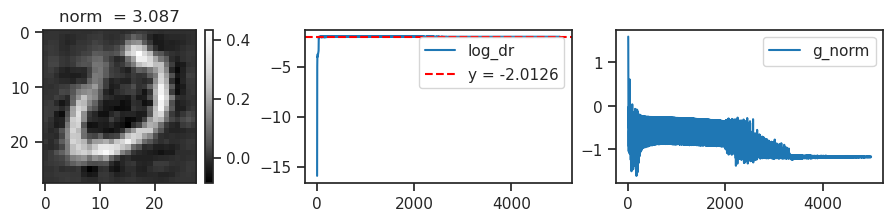

 80%|███████████████████████████████████▏        | 4/5 [37:48<09:26, 566.96s/it]

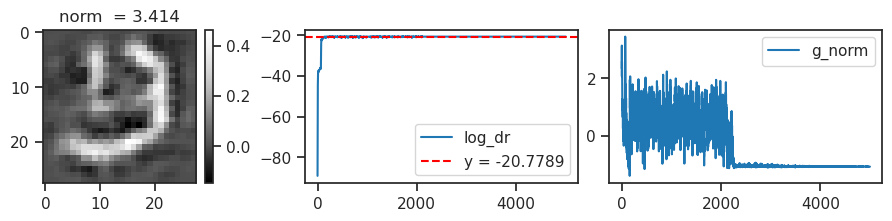

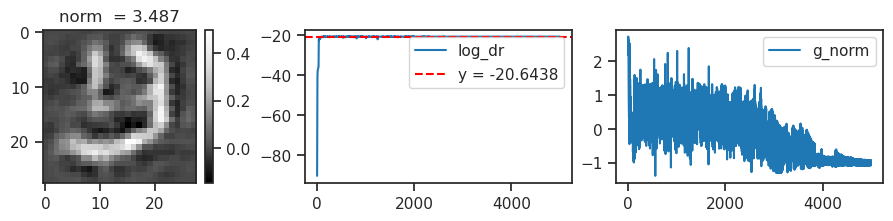

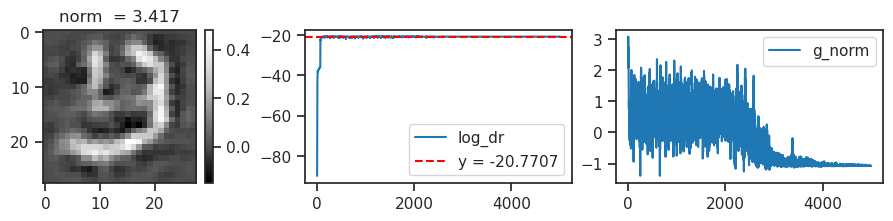

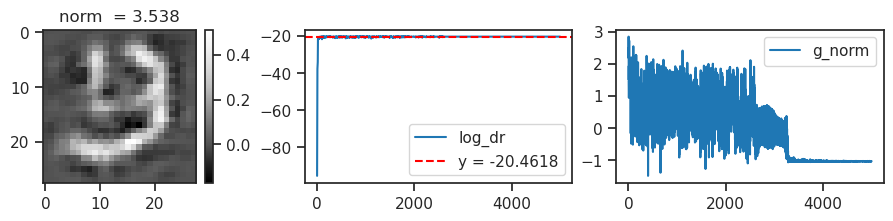

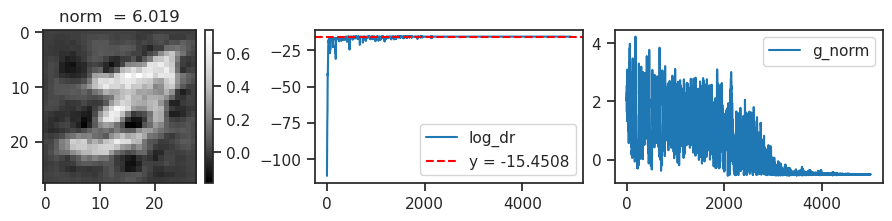

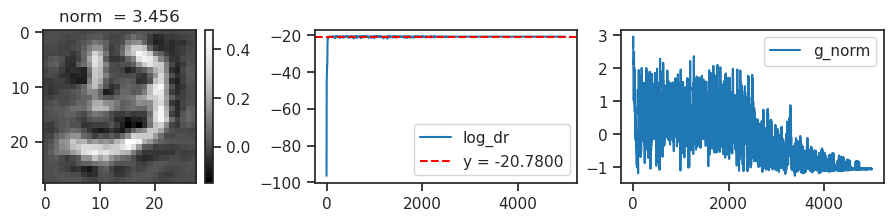

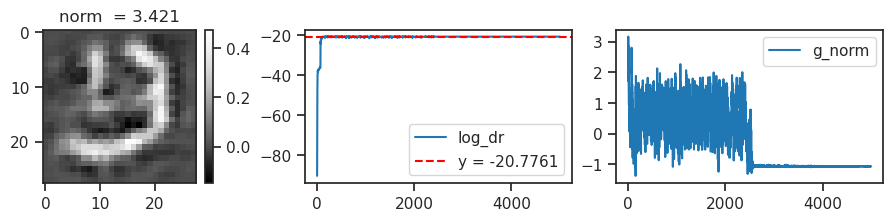

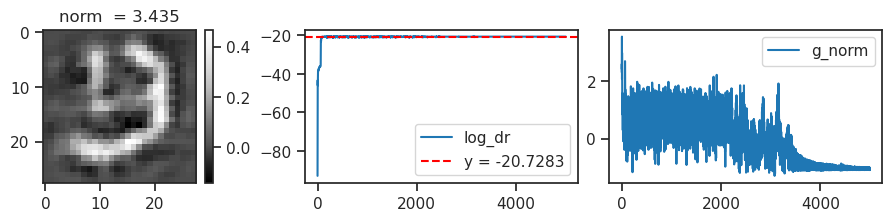

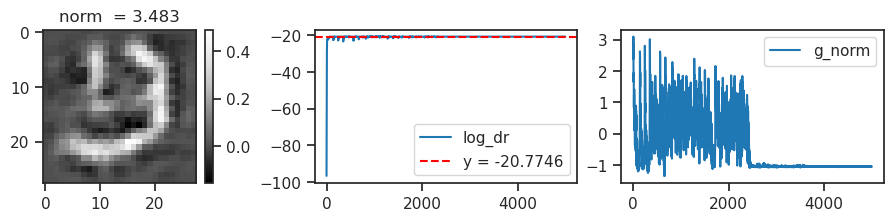

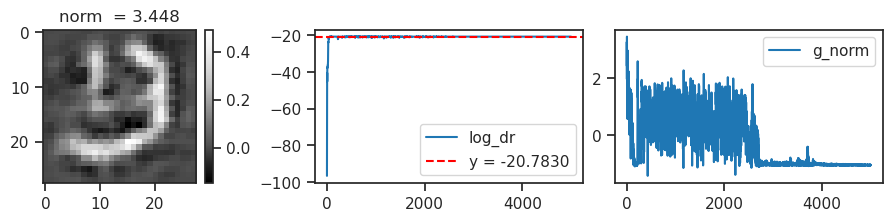

100%|████████████████████████████████████████████| 5/5 [47:04<00:00, 564.86s/it]


In [52]:
alphas = [0, 0.01, 0.1, 1.0, 10]
mei_all = {
    a: np.zeros((tr.model.cfg.n_latents, 28, 28))
    for a in alphas
}
y_all = {
    a: np.zeros(tr.model.cfg.n_latents)
    for a in alphas
}
for i, a in tqdm(enumerate(alphas), total=len(alphas), ncols=80):
    for j in range(tr.model.cfg.n_latents):
        mei_all[a][j], y_all[a][j] = _do_it(j, a, func_kl);

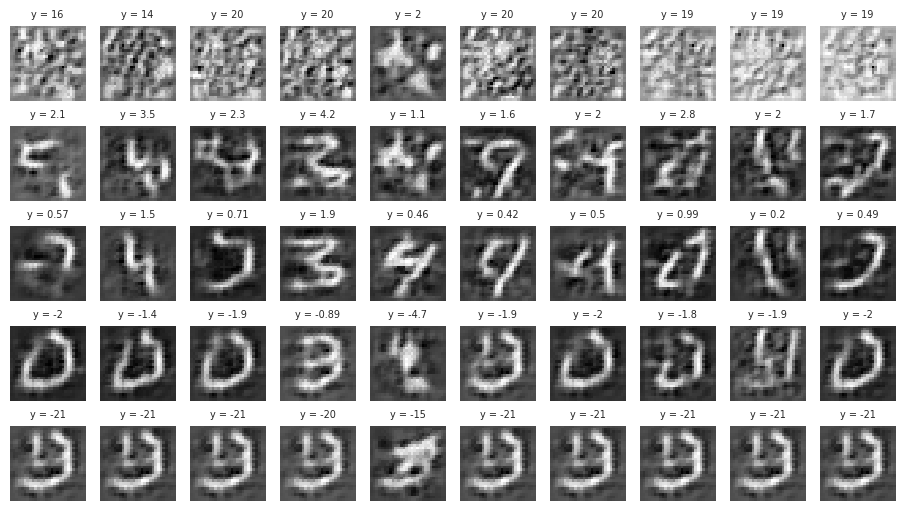

In [53]:
cmap = 'Greys_r'

fig, axes = create_figure(len(alphas), tr.model.cfg.n_latents, (9, 1.0 * len(alphas)), 'all', 'all', 'constrained')
axes = axes.reshape((len(alphas), tr.model.cfg.n_latents))
for j in range(tr.model.cfg.n_latents):
    for i, a in enumerate(alphas):
        axes[i, j].imshow(mei_all[a][j], cmap=cmap)
        axes[i, j].set_title(f"y = {y_all[a][j]:0.2g}", fontsize=7)
remove_ticks(axes)
plt.show()

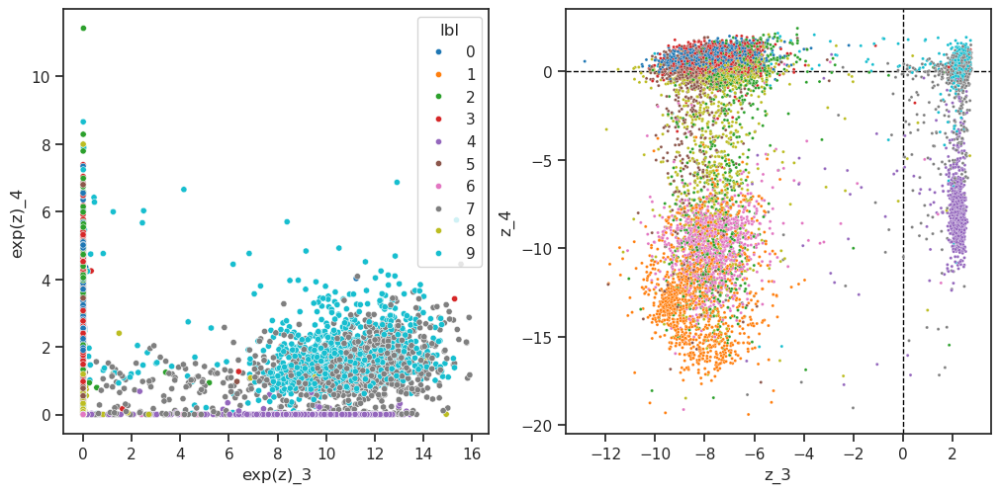

In [7]:
_show_pairwise(3, 4, etc['log_dr'], np.exp)

## Spike triggered average?

In [10]:
# data, loss, etc = tr.forward('trn', temp=0.0)
# data_vld, loss_vld, etc_vld = tr.forward('vld', temp=0.0)

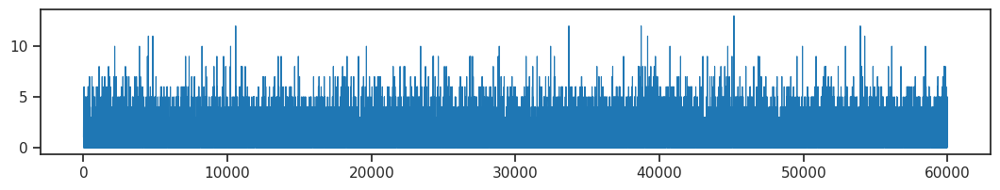

In [11]:
which_k = 4

fig, ax = create_figure(1, 1, (13, 2))
ax.plot(data['z'][:, which_k], lw=0.8)
plt.show()

In [12]:
sta = np.einsum('im, ijk -> mjk', data['z'], data['x'][:, 0, ...])
sta/= sta.std(axis=(1, 2), keepdims=True)
sta.shape

(10, 28, 28)

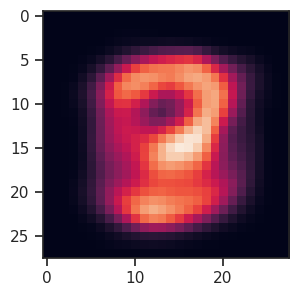

In [13]:
plt.imshow(sta[3])
plt.show()

In [14]:
sta = np.einsum('im, ijk -> mjk', etc['r*dr'], data['x'][:, 0, ...])
sta/= sta.std(axis=(1, 2), keepdims=True)
sta.shape

(10, 28, 28)

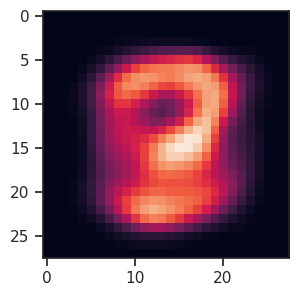

In [15]:
plt.imshow(sta[3])
plt.show()

In [22]:
from analysis.eval import knn_analysis

In [27]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=tr.dl_vld.dataset.tensors[1],
    n_iter=2000,
    verbose=True,
)

train sample size: 2000, iter #1698:  86%|████████▌ | 13698/16001 [29:31<06:19,  6.07it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [28]:
df_summary  # n_iter = 2000

,mean,std
size,,
20,0.364543,0.050157
50,0.579243,0.046145
100,0.719837,0.035018
200,0.819498,0.022506
500,0.890265,0.010810
1000,0.918115,0.007148
2000,0.938100,0.004242
4000,0.951122,0.001603
5000,0.954800,NaN


In [26]:
## Was n_iter = 100

,mean,std
size,,
20,0.370042,0.051413
50,0.576812,0.049825
100,0.721410,0.035182
200,0.819578,0.024589
500,0.890386,0.011766
1000,0.918714,0.007579
2000,0.938044,0.004573
4000,0.951160,0.001714
5000,0.954800,NaN


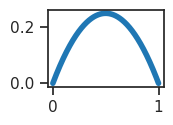

In [69]:
p = np.linspace(0, 1, 1001)
var = p * (1 - p)
plt.figure(figsize=(1.5, 1.0))
plt.plot(p, var, lw=4)
plt.show()

In [7]:
def extract_data_gaussian(dl_name: str):
    dl = getattr(tr, f"dl_{dl_name}")
    
    mu, sig, y = [], [], []
    for _x, _y in tqdm(iter(dl), total=len(dl), ncols=80):
        q = tr.model.infer(_x)
        sig.append(q.sigma)
        mu.append(q.mu)
        y.append(_y)
    
    mu, sig, y = map(
        lambda e: to_np(torch.cat(e)),
        [mu, sig, y],
    )
    return mu, sig, y


def extract_data_poisson(dl_name: str):
    dl = getattr(tr, f"dl_{dl_name}")

    log_dr, lamb, y = [], [], []
    for _x, _y in tqdm(iter(dl), total=len(dl), ncols=80):
        _log_dr, q = tr.model.infer(_x)
        log_dr.append(_log_dr)
        lamb.append(q.rates)
        y.append(_y)
    
    log_dr, lamb, y = map(
        lambda e: to_np(torch.cat(e)),
        [log_dr, lamb, y],
    )
    return log_dr, lamb, y

In [8]:
log_dr, lamb, y = extract_data_gaussian('trn')
log_dr_vld, lamb_vld, y_vld = extract_data_gaussian('vld')

100%|███████████████████████████████████████████| 50/50 [00:02<00:00, 23.19it/s]


In [9]:
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import classification_report

In [10]:
knn = KNeighborsClassifier(
    n_neighbors=5,
    metric='minkowski',  # 'euclidean',
).fit(log_dr, y)
y_pred = knn.predict(log_dr_vld)

report = classification_report(y_vld, y_pred, digits=3)
print(report)

(y_vld == y_pred).sum() / len(y_vld)

precision    recall  f1-score   support

           0      0.970     0.992     0.981       980
           1      0.977     0.993     0.985      1135
           2      0.942     0.977     0.959      1032
           3      0.954     0.950     0.952      1010
           4      0.981     0.957     0.969       982
           5      0.957     0.956     0.957       892
           6      0.978     0.970     0.974       958
           7      0.957     0.960     0.959      1028
           8      0.983     0.953     0.968       974
           9      0.960     0.946     0.953      1009

    accuracy                          0.966     10000
   macro avg      0.966     0.965     0.966     10000
weighted avg      0.966     0.966     0.966     10000

0.9659

In [11]:
clf = LogisticRegression().fit(log_dr, y)
y_pred = clf.predict(log_dr_vld)

report = classification_report(y_vld, y_pred)
print(report)

(y_vld == y_pred).sum() / len(y_vld)

precision    recall  f1-score   support

           0       0.95      0.98      0.97       980
           1       0.97      0.98      0.98      1135
           2       0.91      0.92      0.91      1032
           3       0.93      0.93      0.93      1010
           4       0.97      0.96      0.97       982
           5       0.94      0.94      0.94       892
           6       0.96      0.94      0.95       958
           7       0.94      0.93      0.93      1028
           8       0.95      0.94      0.94       974
           9       0.96      0.95      0.95      1009

    accuracy                           0.95     10000
   macro avg       0.95      0.95      0.95     10000
weighted avg       0.95      0.95      0.95     10000

0.9475

In [12]:
svc = LinearSVC(dual='auto').fit(log_dr, y)
y_pred = svc.predict(log_dr_vld)

report = classification_report(y_vld, y_pred)
print(report)

(y_vld == y_pred).sum() / len(y_vld)

precision    recall  f1-score   support

           0       0.89      0.96      0.92       980
           1       0.97      0.99      0.98      1135
           2       0.87      0.91      0.89      1032
           3       0.92      0.86      0.89      1010
           4       0.92      0.93      0.93       982
           5       0.86      0.90      0.88       892
           6       0.93      0.89      0.91       958
           7       0.89      0.87      0.88      1028
           8       0.94      0.92      0.93       974
           9       0.91      0.86      0.88      1009

    accuracy                           0.91     10000
   macro avg       0.91      0.91      0.91     10000
weighted avg       0.91      0.91      0.91     10000

0.91

In [22]:
subset = np.random.choice(range(len(y)), size=100, replace=False)

knn = KNeighborsClassifier(
    n_neighbors=5,
    metric='minkowski',  # 'euclidean',
).fit(log_dr[subset], y[subset])
y_pred = knn.predict(log_dr_vld)

report = classification_report(y_vld, y_pred, digits=3)
print(report)

(y_vld == y_pred).sum() / len(y_vld)

precision    recall  f1-score   support

           0      0.390     0.946     0.552       980
           1      0.583     0.989     0.734      1135
           2      0.596     0.427     0.498      1032
           3      0.541     0.823     0.653      1010
           4      0.872     0.480     0.619       982
           5      0.756     0.313     0.443       892
           6      0.807     0.446     0.574       958
           7      0.655     0.446     0.531      1028
           8      0.855     0.543     0.664       974
           9      0.742     0.486     0.587      1009

    accuracy                          0.598     10000
   macro avg      0.680     0.590     0.585     10000
weighted avg      0.676     0.598     0.588     10000

0.5977

In [45]:
tr.model.cfg.seed

0

In [28]:
report = classification_report(y_vld, y_pred, output_dict=True)
report['accuracy']

0.5977

In [ ]:
which_k = 3

fig, ax = create_figure(1, 1, (9, 1.8))
sns.histplot(np.log(etc['dr'][:, which_k]), bins=200, stat='percent', ax=ax)
ax.axvline(0, color='r', ls='--')
plt.show()

In [ ]:
max_i = np.argmax(etc['dr'][:, which_k])
min_i = np.argmin(etc['dr'][:, which_k])

max_i, min_i

In [ ]:
fig, axes = create_figure(1, 2, (3, 2), layout='constrained')
axes[0].imshow(to_np(tr.dl_vld.dataset[max_i][0].squeeze()))
axes[1].imshow(to_np(tr.dl_vld.dataset[min_i][0].squeeze()))
axes[0].set_title(f"dr = {etc['dr'][max_i, which_k]:0.3g}")
axes[1].set_title(f"dr = {etc['dr'][min_i, which_k]:0.3g}")
remove_ticks(axes)
plt.show()

In [ ]:
from analysis.mei import MEI

In [ ]:
def func(model, x):
    return model.encode(x).squeeze()[which_k]

mei = MEI(
    model=tr.model,
    func=func,
    maximize=True,
    n_iter=int(3e2),
    kws_optim={
        'lr': 0.1,
        'weight_decay': 0.1},
).to(device)

# fit
mei.fit()
x2p = to_np(mei._x().squeeze())

# plot
fig, axes = create_figure(1, 3, (9, 2.1), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
plt.colorbar(im, ax=axes[0])

axes[1].plot(mei.stats['y'], label='log_dr')
_y = mei.stats['y'][-1]
axes[1].axhline(_y, color='r', ls='--', label=f"y = {_y:0.4f}")
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')

axes[0].set_title(f"norm  = {mei.x.norm().item():0.3f}")
add_legend(axes[1:])
plt.show()

In [ ]:
def func(model, x, which_k, alpha=0.0):
    log_dr = model.encode(x).squeeze()

    mask = torch.ones(model.cfg.n_latents, dtype=torch.bool)
    mask[which_k] = False

    y = log_dr[which_k]
    reg = log_dr[mask].exp().sum()
    return y - reg.mul(alpha)

In [ ]:
def _do_it(which_k: int, alpha: float = 5.0):
    mei = MEI(
        model=tr.model,
        func=func,
        maximize=True,
        n_iter=int(9e2),
        kws_optim={
            'lr': 0.1,
            'weight_decay': 0.1},
    ).to(device)

    # fit
    mei.fit(which_k, alpha, verbose=False)
    x2p = to_np(mei._x().squeeze())

    # plot
    fig, axes = create_figure(1, 3, (9, 2.1), width_ratios=[0.7, 1, 1], layout='constrained')
    
    im = axes[0].imshow(x2p, cmap='Greys_r')
    plt.colorbar(im, ax=axes[0])
    
    axes[1].plot(mei.stats['y'], label='log_dr')
    _y = mei.stats['y'][-1]
    axes[1].axhline(_y, color='r', ls='--', label=f"y = {_y:0.4f}")
    axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
    
    axes[0].set_title(f"norm  = {mei.x.norm().item():0.3f}")
    add_legend(axes[1:])
    plt.show()

    return x2p, _y

In [ ]:
alphas = [0, 0.01, 0.1, 1, 5, 10, 100]
mei_all = {
    a: np.zeros((tr.model.cfg.n_latents, 28, 28))
    for a in alphas
}
y_all = {
    a: np.zeros(tr.model.cfg.n_latents)
    for a in alphas
}
for i, a in tqdm(enumerate(alphas), total=len(alphas), ncols=80):
    for j in range(tr.model.cfg.n_latents):
        mei_all[a][j], y_all[a][j] = _do_it(j, a);

In [ ]:
fig, axes = create_figure(len(alphas), tr.model.cfg.n_latents, (9, 1.0 * len(alphas)), 'all', 'all', layout='constrained')
for j in range(tr.model.cfg.n_latents):
    for i, a in enumerate(alphas):
        axes[i, j].imshow(mei_all[a][j], cmap='Greys_r')
        axes[i, j].set_title(f"y = {y_all[a][j]:0.2g}", fontsize=7)
remove_ticks(axes)

In [ ]:
def _do_it(which_k: int, maximize=True):
    mei = MEI(
        model=tr.model,
        func=func,
        maximize=maximize,
        n_iter=int(3e2),
        kws_optim={
            'lr': 0.1,
            'weight_decay': 0.1},
    ).to(device)
    
    # fit
    mei.fit(schedule=True, verbose=False)
    x2p = to_np(mei._x().squeeze())
    
    # plot
    fig, axes = create_figure(1, 3, (9, 2.1), width_ratios=[0.7, 1, 1], layout='constrained')
    
    im = axes[0].imshow(x2p, cmap='Greys_r')
    plt.colorbar(im, ax=axes[0])
    
    axes[1].plot(mei.stats['y'], label='log_dr')
    _y = mei.stats['y'][-1]
    axes[1].axhline(_y, color='r', ls='--', label=f"y = {_y:0.4f}")
    axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')

    axes[0].set_title(f"norm  = {mei.x.norm().item():0.3f}")
    add_legend(axes[1:])
    plt.show()

    return x2p

In [ ]:
mei_all = np.zeros((tr.model.cfg.n_latents, 28, 28))
mii_all = np.zeros((tr.model.cfg.n_latents, 28, 28))

for i in range(tr.model.cfg.n_latents):
    print(f'Latent # {i}')
    mei_all[i] = _do_it(i, maximize=True)
    mii_all[i] = _do_it(i, maximize=False)
    print('-' * 70)
    print('\n\n')

In [ ]:
fig, axes = create_figure(2, 20, (18 * (tr.model.cfg.n_latents) / 10, 1.8), 'all', 'all', layout='constrained')
for i in range(tr.model.cfg.n_latents):
    axes[0, i].imshow(mei_all[i], cmap='Greys_r')
    axes[1, i].imshow(mii_all[i], cmap='Greys_r')
remove_ticks(axes)

In [ ]:
fig, axes = create_figure(2, 10, (9, 1.8), 'all', 'all', layout='constrained')
for i in range(10):
    axes[0, i].imshow(mei_all[i], cmap='Greys_r')
    axes[1, i].imshow(mii_all[i], cmap='Greys_r')
remove_ticks(axes)

In [ ]:
_show_pairwise(3, 2)

In [ ]:
rng = get_rng()

start = rng.normal(size=(1, 1, 28, 28))
start = torch.nn.Parameter(
    data=torch.tensor(start).float(),
    requires_grad=True,
)
start = start.to(device)

In [ ]:
fig, ax = create_figure(dpi=50)
im = ax.imshow(to_np(start.squeeze()), cmap='Greys_r')
plt.colorbar(im, ax=ax)
remove_ticks(ax)
plt.show()

In [ ]:
from analysis.mei import MEI, compute_mei

In [ ]:
which_k = 3

In [ ]:
%%time

xx = compute_mei(
    model=tr.model.eval(),
    idx=which_k,
    start=start,
    excite=False,
    nsteps=10000,
    alpha=0.1,
)

In [ ]:
fig, ax = create_figure(dpi=80)
im = ax.imshow(to_np(xx.squeeze()), cmap='Greys_r')
plt.colorbar(im, ax=ax)
remove_ticks(ax)
plt.show()

In [ ]:
name = '/'.join([
    'poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>_wn',
    'mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_23,14:55)'
])
tr, meta = load_quick(name, False, device=device)
data, loss, etc = tr.validate()

In [ ]:
which_k = 3

fig, ax = create_figure(1, 1, (9, 1.8))
sns.histplot(np.log(etc['dr'][:, which_k]), bins=200, stat='percent', ax=ax)
ax.axvline(0, color='r', ls='--')
plt.show()

In [ ]:
from analysis.mei import MEI

def func(model, x):
    return model.encode(x).squeeze()[which_k]

### normalize=True, warm=0

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=True,
    n_iter=int(1e2),
    kws_optim={
        'lr': 0.1,
        'weight_decay': 0.1},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=False,
    n_iter=int(1e2),
    kws_optim={
        'lr': 0.1,
        'weight_decay': 0.1},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

In [ ]:
which_k = 4

fig, ax = create_figure(1, 1, (9, 1.8))
sns.histplot(np.log(etc['dr'][:, which_k]), bins=200, stat='percent', ax=ax)
ax.axvline(0, color='r', ls='--')
plt.show()

In [ ]:
def func(model, x):
    return model.encode(x).squeeze()[which_k]

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=True,
    n_iter=int(1e2),
    kws_optim={
        'lr': 1,
        'weight_decay': 0.1},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=False,
    n_iter=int(1e2),
    kws_optim={
        'lr': 1,
        'weight_decay': 0.1},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

In [ ]:
which_k = 0

fig, ax = create_figure(1, 1, (9, 1.8))
sns.histplot(np.log(etc['dr'][:, which_k]), bins=200, stat='percent', ax=ax)
ax.axvline(0, color='r', ls='--')
plt.show()

In [ ]:
def func(model, x):
    return model.encode(x).squeeze()[which_k]

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=True,
    n_iter=int(1e2),
    kws_optim={
        'lr': 0.2,
        'weight_decay': 0.1},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=False,
    n_iter=int(1e2),
    kws_optim={
        'lr': 1,
        'weight_decay': 10},
).to(device)


# fit
mei.fit(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())


# plot
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

mei.x.norm(), mei.stats['y'][-1]

### LBFGS

(used to be normalize=True)

In [ ]:
mei = MEI(
    model=tr.model,
    func=func,
    maximize=True,
    normalize=True,
    n_iter=int(1e2),  # int(1e4),
    kws_optim={'lr': 1},  # 'weight_decay': 0.1
).to(device)

In [ ]:
mei.fit_lbfgs(schedule=True, verbose=True)
x2p = to_np(mei.x.squeeze())

In [ ]:
fig, axes = create_figure(1, 3, (9, 2.0), width_ratios=[0.7, 1, 1], layout='constrained')

im = axes[0].imshow(x2p, cmap='Greys_r')
axes[1].plot(mei.stats['y'], label='log_dr')
axes[2].plot(np.log(mei.stats['g_norm']), label='g_norm')
plt.colorbar(im, ax=axes[0])
add_legend(axes[1:])
plt.show()

In [ ]:
mei.x.norm()

In [ ]:
fig, axes = create_figure(1, 2, (8, 2), layout='constrained')
axes[0].plot(mei.stats['y'])
axes[1].plot(np.exp(mei.stats['y']))

In [ ]:
plt.plot(mei.stats['g_norm'])

In [ ]:
plt.plot(mei.stats['lr'])

In [ ]:
def func(model, x):
    return model(x) + 2

mei = MEI(nn.Linear(5, 10), func)

In [ ]:
x = torch.randn((1, 5))
y = mei(x)

x.shape, y.shape

In [ ]:
tr.cfg.scheduler_kws

poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>_wn
mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_23,14:55)

In [ ]:
# name = 'poisson_uniform_c(-3)_rmax(1)_MNIST_z-20_k-32_<conv+b|conv+b>_wn/mc_ep300-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.7)_gr(500)_(2024_04_23,10:03)'
name = '/'.join([
    'poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>_wn',
    'mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_23,14:55)'
])
tr, meta = load_quick(name, lite=False)

print(meta)

In [ ]:
tr.show_recon(0.0);
tr.show_samples(0.0);

In [ ]:
data, loss, etc = tr.validate()

In [ ]:
list(etc)

In [ ]:
lbls = tr.dl_vld.dataset.test_labels
lbls.shape

In [ ]:
etc['dr'].shape

In [ ]:
i, j = 4, 3
df = pd.DataFrame(dict(
    x=etc['r*dr'][:, i],
    y=etc['r*dr'][:, j],
    x_log=np.log(etc['r*dr'][:, i]),
    y_log=np.log(etc['r*dr'][:, j]),
    lbl=lbls,
))

In [ ]:
fig, axes = create_figure(1, 2, (10, 5.5), layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=20, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
ax_square(axes)
plt.show()

In [ ]:
p = list(tr.model.parameters())
pp = list(tr.parameters())

In [ ]:
len(p), len(pp)

In [ ]:
p[0]

In [ ]:
i, j = 0, 1
df = pd.DataFrame(dict(
    x=etc['dr'][:, i],
    y=etc['dr'][:, j],
    x_log=np.log(etc['dr'][:, i]),
    y_log=np.log(etc['dr'][:, j]),
    lbl=lbls,
))

In [ ]:
fig, axes = create_figure(1, 2, (10, 5), layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=30, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=7, ax=axes[1])
axes[1].axvline(0, color='dimgrey', zorder=0)
axes[1].axhline(0, color='dimgrey', zorder=0)
ax_square(axes)
plt.show()

In [ ]:
i, j = 5, 7
df = pd.DataFrame(dict(
    x=etc['dr'][:, i],
    y=etc['dr'][:, j],
    x_log=np.log(etc['dr'][:, i]),
    y_log=np.log(etc['dr'][:, j]),
    lbl=lbls,
))

In [ ]:
fig, axes = create_figure(1, 2, (10, 5), layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=30, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=7, ax=axes[1])
axes[1].axvline(0, color='dimgrey', zorder=0)
axes[1].axhline(0, color='dimgrey', zorder=0)
ax_square(axes)
plt.show()

In [ ]:
i, j = 6, 15
df = pd.DataFrame(dict(
    x=etc['r*dr'][:, i],
    y=etc['r*dr'][:, j],
    x_log=np.log(etc['r*dr'][:, i]),
    y_log=np.log(etc['r*dr'][:, j]),
    lbl=lbls,
))

In [ ]:
fig, axes = create_figure(1, 2, (10, 5), dpi=200, layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=30, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=7, ax=axes[1])
axes[1].axvline(0, color='dimgrey', zorder=0)
axes[1].axhline(0, color='dimgrey', zorder=0)
ax_square(axes)
plt.show()

In [ ]:
name = 'poisson_uniform_c(-3)_rmax(1)_MNIST_z-20_k-32_<conv+b|conv+b>_wn/mc_ep600-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(500)_(2024_04_23,12:49)'
tr, meta = load_quick(name, False)

In [ ]:
tr.show_recon(0.0), tr.show_samples(0.0);

In [ ]:
data, loss, etc = tr.validate()

In [ ]:
i, j = 1, 19
df = pd.DataFrame(dict(
    x=etc['r*dr'][:, i],
    y=etc['r*dr'][:, j],
    x_log=np.log(etc['r*dr'][:, i]),
    y_log=np.log(etc['r*dr'][:, j]),
    lbl=lbls,
))

fig, axes = create_figure(1, 2, (10, 5.5), layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=20, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
ax_square(axes)
plt.show()

In [ ]:
i, j = 5, 17
df = pd.DataFrame(dict(
    x=etc['r*dr'][:, i],
    y=etc['r*dr'][:, j],
    x_log=np.log(etc['r*dr'][:, i]),
    y_log=np.log(etc['r*dr'][:, j]),
    lbl=lbls,
))

fig, axes = create_figure(1, 2, (10, 5.5), layout='constrained')
sns.scatterplot(data=df, x='x', y='y', hue='lbl', palette='tab10', s=20, ax=axes[0])
sns.scatterplot(data=df, x='x_log', y='y_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
ax_square(axes)
plt.show()

In [ ]:
name = 'poisson_uniform_c(-3)_rmax(1)_MNIST_z-512_k-32_<conv+b|conv+b>_wn/mc_ep300-b200-lr(0.005)_beta(1:0x0.5)_temp(0.05:exp-1)_gr(500)_(2024_04_23,01:02)'
tr, meta = load_quick(name, False)

In [ ]:
tr.show_recon(0.0), tr.show_samples(0.0);

In [ ]:
rng = get_rng()

start = rng.normal(size=(1, 1, 28, 28))
start = np.repeat(start, 20, axis=0)
start = torch.nn.Parameter(
    data=torch.tensor(start).float(),
    requires_grad=True,
)
start = start.to(device)

In [ ]:
fig, ax = create_figure(1, 1, (2, 1.5))
im = ax.imshow(to_np(start[0].squeeze()), cmap='Greys_r')
plt.colorbar(im, ax=ax);

In [ ]:
x = tr.to(start.clone())

In [ ]:
tr.model.zero_grad()
x_copy = x.clone()

# Get the current prediction
out = tr.model(x)
log_dr, _ = tr.model.infer(x)

In [ ]:
log_dr.shape

In [ ]:
y = torch.diag(log_dr)
y.shape

In [ ]:
g = torch.autograd.grad(y, x, retain_graph=True)

In [ ]:
nrows = 16
ncols = int(np.ceil(20 / nrows))

In [ ]:
nrows, ncols

In [ ]:
kws_vae = dict(enc_type='conv', enc_bias=True, rmax_q=1.0)
kws_tr = dict(kl_beta=1.0, method='mc')

vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**kws_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**kws_tr), device=device)

In [ ]:
vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}")

In [ ]:
comment = tr.cfg.name()
tr.train(comment=comment)

In [ ]:
data, loss, rates = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

In [ ]:
dead_thres = 0 # 0.002
dead = loss['kl_diag'] < dead_thres
dead.sum()

In [ ]:
upper_lim = 120
ax = sns.histplot(loss['kl_diag'] * 1000, bins=np.linspace(0, upper_lim, upper_lim + 1))
ax.locator_params(axis='x', nbins=15)
ax.axvline(dead_thres * 1000, color='r', ls='--', alpha=0.6)
plt.show()

In [ ]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.05)
percents

In [ ]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [ ]:
log_r8s = to_np(tr.model.log_rates.squeeze())
order = np.argsort(log_r8s)

In [ ]:
vae.show(order=order);

In [ ]:
vae.show(order=np.argsort(loss['kl_diag']));

In [ ]:
prior_rates = to_np(vae.log_rates)[:, ~dead].ravel()

mu = prior_rates.mean()
sd = prior_rates.std()

rv = sp_stats.norm(loc=mu, scale=sd)
xs = np.linspace(-5.1, 2.4, 100)
pdf = rv.pdf(xs)

In [ ]:
fig, ax = create_figure()

sns.histplot(prior_rates, stat='density', bins=50, kde=True, label='log prior rates', ax=ax)
ax.plot(xs, pdf, color='r', lw=2, ls='--', label='lognorm fit')
add_legend(ax)
plt.show()

In [ ]:
name = 'poisson_uniform_c(-3)_rmax(0.99)_DOVES_z-512_<lin|lin>/mc_ep3600-b1000-lr(0.005)_beta(1:0x0.5)_temp(0.05:exp-1)_gr(500)_(2024_04_11,15:00)'
tr, meta = load_quick(name, lite=False)

print(meta)

In [ ]:
samples, spks = tr.sample(temp=0.0)

In [ ]:
from figures.imgs import plot_recon, plot_samples

In [ ]:
plot_samples(tr, 0.0);

In [ ]:
from utils.plotting import *


def plot_weights(
		w: np.ndarray,
		nrows: int = 16,
		method: str = 'min-max',
		title: str = None,
		display: bool = True,
		**kwargs, ):
	defaults = dict(
		dpi=160,
		figsize=(8, 4),
		title_fontsize=8,
		title_y=1.01,
	)
	kwargs = setup_kwargs(defaults, kwargs)

	# make grid
	ncols = int(np.ceil(len(w) / nrows))
	grid_dec = make_grid(
		x=w,
		grid_size=(nrows, ncols),
		method=method,
	)
	# plot
	fig, ax = create_figure(
		figsize=kwargs['figsize'],
		dpi=kwargs['dpi'],
		layout='tight',
	)
	if method == 'min-max':
		kws_show = dict(vmin=0, vmax=1, cmap='Greys_r')
	elif method == 'abs-max':
		kws_show = dict(vmin=-1, vmax=1, cmap=rd_or_bu())
	else:
		raise ValueError(method)
	ax.imshow(grid_dec, **kws_show)
	ax.set_title(
		label=title,
		fontsize=kwargs['title_fontsize'],
		y=kwargs['title_y'],
	)
	remove_ticks(ax)
	if display:
		plt.show()
	else:
		plt.close()
	return fig, ax


def plot_samples(
		trainer,
		t: float = None,
		num: int = 10,
		display: bool = True,
		**kwargs,):
	defaults = dict(
		dpi=100,
		figsize=(5, 5),
		cmap='Greys_r',
		normalize=False,
		pad=0,
	)
	kwargs = setup_kwargs(defaults, kwargs)

	x, _ = trainer.sample(temp=t)
	g2p = make_grid(
		x=x[:num**2],
		grid_size=num,
		pad=kwargs['pad'],
		normalize=kwargs['normalize'],
	)
	fig, ax = create_figure(
		figsize=kwargs['figsize'],
		dpi=kwargs['dpi'],
	)
	plt.imshow(g2p, cmap=kwargs['cmap'])
	remove_ticks(ax)
	if display:
		plt.show()
	else:
		plt.close()
	return fig, ax


def plot_recon(
		trainer,
		t: float = None,
		num: int = 32,
		display: bool = True,
		**kwargs, ):
	defaults = dict(
		dpi=100,
		figsize=(12, 5),
		cmap='Greys_r',
		normalize=False,
		pad=0,
	)
	kwargs = setup_kwargs(defaults, kwargs)

	x = next(iter(trainer.dl_vld))
	if isinstance(x, (tuple, list)):
		x = x[0]
	x = trainer.to(x)

	if t is not None:
		t_original = trainer.model.temp.item()
		trainer.model.update_t(t)
	else:
		t_original = None

	with torch.inference_mode():
		y = trainer.model(x)[-1]

	if t is not None:
		trainer.model.update_t(t_original)

	g2p = make_grid(
		torch.cat([x[:num], y[:num]]),
		grid_size=(2, num),
		pad=kwargs['pad'],
		normalize=kwargs['normalize'],
	)

	fig, ax = create_figure(
		figsize=kwargs['figsize'],
		dpi=kwargs['dpi'],
	)
	ax.imshow(g2p, cmap=kwargs['cmap'])
	remove_ticks(ax)
	if display:
		plt.show()
	else:
		plt.close()
	return fig, ax


def make_grid(
		x: Union[np.ndarray, torch.Tensor],
		grid_size: Union[int, Tuple[int, int]],
		pad: int = 1,
		pad_val: float = np.nan,
		normalize: bool = True,
		**kwargs, ):
	x = to_np(x)
	if x.ndim == 4:
		x = x[:, 0, ...]
	_, h, w = x.shape

	if isinstance(grid_size, int):
		grid_size = (grid_size, grid_size)
	n_rows, n_cols = grid_size

	grid = np.ones((
		(h + pad) * n_rows - pad,
		(w + pad) * n_cols - pad,
	)) * pad_val

	for idx in range(min(n_rows * n_cols, len(x))):
		i = idx // n_cols
		j = idx % n_cols
		a = (h + pad) * i
		b = (w + pad) * j

		y = x[idx]
		if normalize:
			y = normalize_img(
				y, **kwargs)

		grid[a:a + h, b:b + w] = y

	return grid


def normalize_img(
		x: np.ndarray,
		method: str = 'min-max',
		val_range: Tuple[float, float] = (0, 1), ):
	if method == 'min-max':
		xmin = np.min(x)
		xmax = np.max(x)
		x_nrm = (x - xmin) / (xmax - xmin)

		a, b = min(val_range), max(val_range)
		x_nrm = x_nrm * (b - a) + a

	elif method == 'abs-max':
		x_nrm = x / np.max(np.abs(x))
	else:
		raise ValueError(method)

	return x_nrm


In [ ]:
plot_recon(tr, 0.1, normalize=True, pad=2);

In [ ]:
plt.plot(spks[:, 3])

In [ ]:
from figures.weight import plot_weights

In [ ]:
plot_weights(samples[:160, 0], nrows=10);

In [ ]:
from vae.vae import Conv2D, Cell, get_act_fn, DenseResBlock, _build_conv_enc

In [ ]:
# def _build_conv_enc(nch, kws, dataset):
# 	if dataset == 'MNIST':
# 		return nn.Sequential(
# 			Cell(nch, nch, cell_type='normal_pre', **kws),
# 			Cell(nch, nch * 2, cell_type='down_enc', **kws),
# 			Cell(nch * 2, nch * 2, cell_type='normal_pre', **kws),
# 			Conv2D(nch * 2, nch * 2, kernel_size=2, padding='valid', reg_lognorm=kws['reg_lognorm']),
# 			Cell(nch * 2, nch * 4, cell_type='down_enc', **kws),
# 			Cell(nch * 4, nch * 4, cell_type='normal_pre', **kws),
# 			Cell(nch * 4, nch * 8, cell_type='down_enc', **kws),
# 			Cell(nch * 8, nch * 8, cell_type='normal_pre', **kws),
# 			get_act_fn(kws['act_fn'], True),
# 			Conv2D(nch * 8, nch * 16, kernel_size=3, padding='valid', reg_lognorm=kws['reg_lognorm']),
# 			nn.Flatten(start_dim=1),
# 			DenseResBlock(nch * 16, expand=4),
# 		)
# 	elif dataset == 'DOVES':
# 		return nn.Sequential(
# 			Cell(nch, nch, cell_type='normal_pre', **kws),
# 			Cell(nch, nch * 2, cell_type='down_enc', **kws),
# 			Cell(nch * 2, nch * 2, cell_type='normal_pre', **kws),
# 			Cell(nch * 2, nch * 4, cell_type='down_enc', **kws),
# 			Cell(nch * 4, nch * 4, cell_type='normal_pre', **kws),
# 			# Cell(nch * 4, nch * 8, cell_type='down_enc', **kws),
# 			# Cell(nch * 8, nch * 8, cell_type='normal_pre', **kws),
# 			get_act_fn(kws['act_fn'], True),
# 			Conv2D(nch * 4, nch * 8, kernel_size=4, padding='valid', reg_lognorm=kws['reg_lognorm']),
# 			nn.Flatten(start_dim=1),
# 			DenseResBlock(nch * 8, expand=8),
# 		)
# 	else:
# 		raise NotImplementedError


In [ ]:
dataset = 'DOVES'
n_ch = 32

padding = 1 if dataset == 'DOVES' else 'valid'
kws = dict(
    in_channels=1,
    out_channels=n_ch,
    kernel_size=3,
    padding=padding,
    reg_lognorm=True,
)
stem = Conv2D(**kws)



kws = dict(
    reg_lognorm=False,
    act_fn='swish',
    use_bn=False,
    use_se=True,
    eps=1.0,
    n_nodes=2,
    scale=1.0,
)
cnn = _build_conv_enc(n_ch, kws, dataset)

In [ ]:
x = torch.randn(123, 1, 16, 16)
y = stem(x)
y.shape

In [ ]:
y = cnn(y)
y.shape

In [ ]:
print_num_params(cnn)

In [ ]:
cnn[-1].dim